- Examples: 
    1. https://github.com/arief25ramadhan/carvana-unet-segmentation/tree/main
    2. https://www.kaggle.com/code/alanyu223/unet-segmentation-on-carvana-dataset
    3. https://www.kaggle.com/code/yacinerouizi/carvana-vgg19-u-net
- Data: 
    - url: https://www.kaggle.com/c/carvana-image-masking-challenge/data
    - The dataset is obtained from Kaggle's Carvana Image Masking Challenge in 2017. The goal is to develop an algorithm that automatically removes the photo studio background from the car. In this repository, we only use the training set, and split it into train/val/test set. We don't download the test set from Kaggle because it has a very huge size. The data consists of car images and their corresponding masks as shown below.

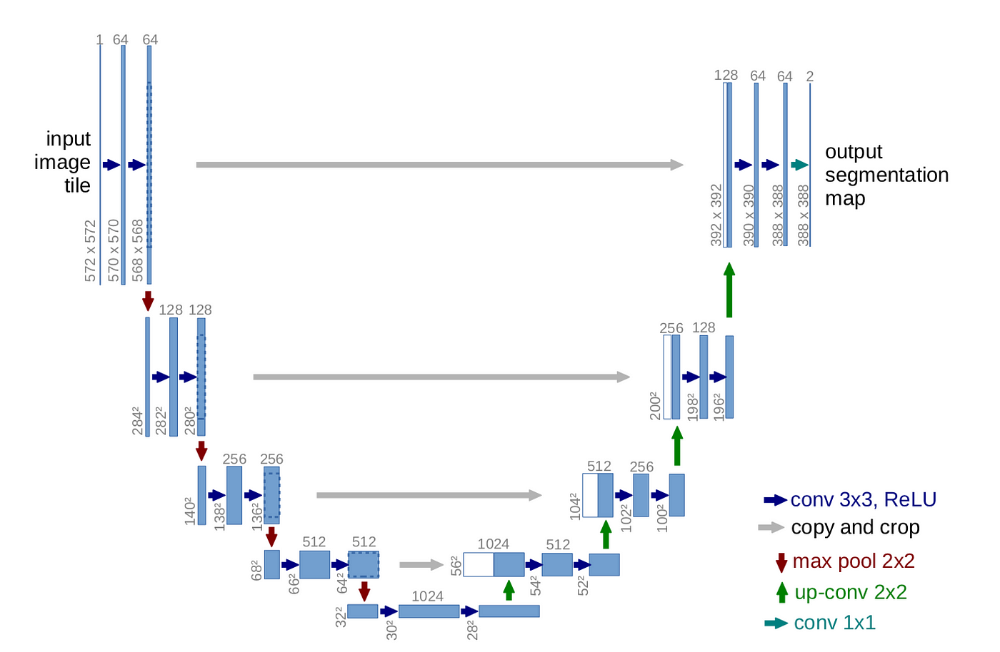

### Split the dataset from large into train and val

In [ ]:
import os
import random
import shutil

# Set the path to your dataset directory containing 'imgs' and 'masks' folders
dataset_path = r"D:\AI\Kaggle_Data\Carvana\data"

# Set the paths for train and validation directories
train_path = r"D:\AI\Kaggle_Data\Carvana\train"
val_path = r"D:\AI\Kaggle_Data\Carvana\val"

# Define the ratio for train and validation data
train_ratio = 0.9
val_ratio = 0.1

# Create train and validation directories if they don't exist
#os.makedirs(train_path, exist_ok=True)
#os.makedirs(val_path, exist_ok=True)

# Iterate through the 'imgs' folder
imgs_folder = os.path.join(dataset_path, "imgs")
for img_file in os.listdir(imgs_folder):
    #print(img_file)
    if img_file.endswith(".jpg"):
        img_name = img_file.split(".")[0]  # Extract the image name without extension
        mask_name = img_name + "_mask.gif"  # Generate corresponding mask name

        # Check if the corresponding mask exists
        mask_file = os.path.join(dataset_path, "masks", mask_name)
        if os.path.exists(mask_file):
            # Decide whether to put the current image in train or validation set
            if random.random() < train_ratio:
                shutil.copy(os.path.join(imgs_folder, img_file), os.path.join(train_path, img_file))
                shutil.copy(mask_file, os.path.join(train_path, mask_name))
            else:
                shutil.copy(os.path.join(imgs_folder, img_file), os.path.join(val_path, img_file))
                shutil.copy(mask_file, os.path.join(val_path, mask_name))

- ### `nn.Conv2d `
    - will keep the size of image 
    - but change the channels as required.
    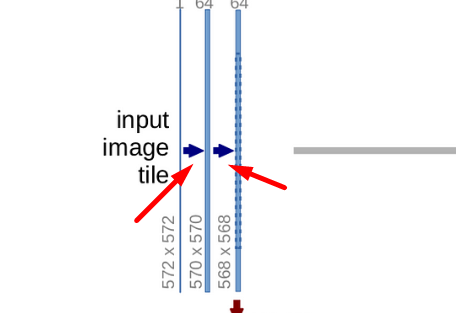
    
- ### `nn.MaxPool2d `
    - will keep the number of channels, 
    - but reduce the image w, h to half
    - Red arrow in chart above
    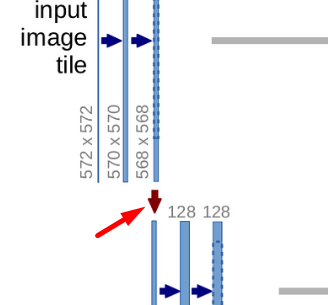
    
- ### `self.final_conv`
    - doesn't change the size of image,
    - only change the channel number from firt one in features to requested in output
    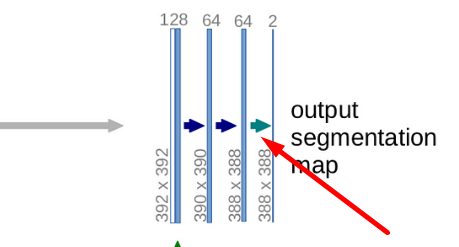
    
- ### `skip_connection`
    - hold the connections from input to output (gray lines)
    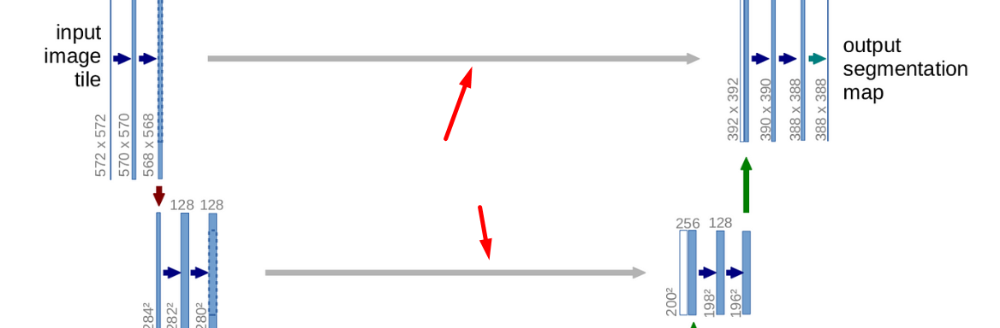

## 1. Model.py

In [ ]:
import torch
import torch.nn as nn
import torchvision.transforms.functional as TF

In [ ]:
class DoubleConv(nn.Module):
    def __init__(self, in_channel, out_channel):
        super(DoubleConv, self).__init__()
        self.conv = nn.Sequential(
            ### 1 st process
            ###### this line only changed the size of channels
            nn.Conv2d(in_channel,out_channel, kernel_size=3, stride=1, padding =1,bias = False),
            # Convert number to float between [0,1]
            nn.BatchNorm2d(out_channel),
            nn.ReLU(inplace=True),
            ### 2nd process
            # Conv 2nd time
            nn.Conv2d(out_channel,out_channel, kernel_size=3, stride=1, padding =1,bias = False),
            nn.BatchNorm2d(out_channel),
            nn.ReLU(inplace=True)
        )
    
    def forward(self,x):
        return self.conv(x)

In [ ]:
class Unet(nn.Module):
    # 3 channels to 1
    def __init__(self, in_channel=3, out_channel=1, features=[64,128,256,512]):
        super(Unet, self).__init__()
        
        # use modulke list to hold all operations in down/up sampling
        self.ups = nn.ModuleList()
        self.downs = nn.ModuleList()
        ####### MaxPooling will keep the number of channels, but reduce the image size to half
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
        
        #add operations for down samplings
        # red down arrows
        for feature in features: #loop from 64 to 512
            self.downs.append(DoubleConv(in_channel, feature))
            in_channel= feature
        
        # add operations for up samplings  
        # green up arrows
        for feature in reversed(features): #loop from 512 to 64
            self.ups.append(nn.ConvTranspose2d(feature*2,feature,kernel_size=3,stride=1,padding=1))
            self.ups.append(DoubleConv(in_channel=feature*2, out_channel=feature))
            
        # Bottleneck : up scale the channels to double
        self.bottleneck = DoubleConv(features[-1], features[-1]*2)
            
        # Final Conv
        ####### Final conv doesn;'t change the size of image, only change the channel number from firt one to requested in output
        self.final_conv = nn.Conv2d(features[0], out_channel, kernel_size=1)
    
    # this shows all steps (process) need to be down in the whole process
    def forward(self,x):
        skip_connections = []
        for down in self.downs:
            # x is the output of this down sampling block
            x = down(x)
            # add output of this block to list
            skip_connections.append(x)
            x = self.pool(x)
        x= self.bottleneck(x)
        
        # use array way to reverse the list, so that add connection from bottom to top
        skip_connections = skip_connections[::-1]
        for idx in range(0,len(self.ups),2):
            x = self.ups[idx](x)
            skip_connection = skip_connections[idx//2]
            # deal with the shape are not same between current x and pre-connection
            if skip_connection.shape!= x.shape:
                # Original Paper is not resize, it does copy and crop
                x = TF.resize(x,size=skip_connection.shape[2:])
            concat = torch.cat((x,skip_connection),dim=1)
            x =self.ups[idx+1](concat)
        #do the last step - final conv 
        return self.final_conv(x)

#### Quick Test

In [ ]:
x = torch.randn((3,3,160,160))
model = Unet(in_channel = 3, out_channel=1)
preds=model(x)
print(x.shape)
print(preds.shape)
    


In [ ]:
import matplotlib.pyplot as plt
import numpy as np

In [ ]:
# Transpose array from (3,160,160) to (160,160,3) which is normal shape for rgb image
x = np.transpose(x, (2, 3, 1,0))  # Transpose to channels-last format
print(x.shape)
plt.imshow(x[:,:,:,0])
plt.colorbar()

In [ ]:
# Transpose array from (3,160,160) to (160,160,3) which is normal shape for rgb image
preds_cpu = preds.detach().numpy()  #convert value from GPU to cpu
p = np.transpose(preds_cpu, (2, 3, 1,0))  # Transpose to channels-last format
print(p.shape)
plt.imshow(p[:,:,:,0], cmap="gray")
plt.colorbar()

## 2. Dataset.py

Carvana dataset: https://www.kaggle.com/c/carvana-image-masking-challenge/data

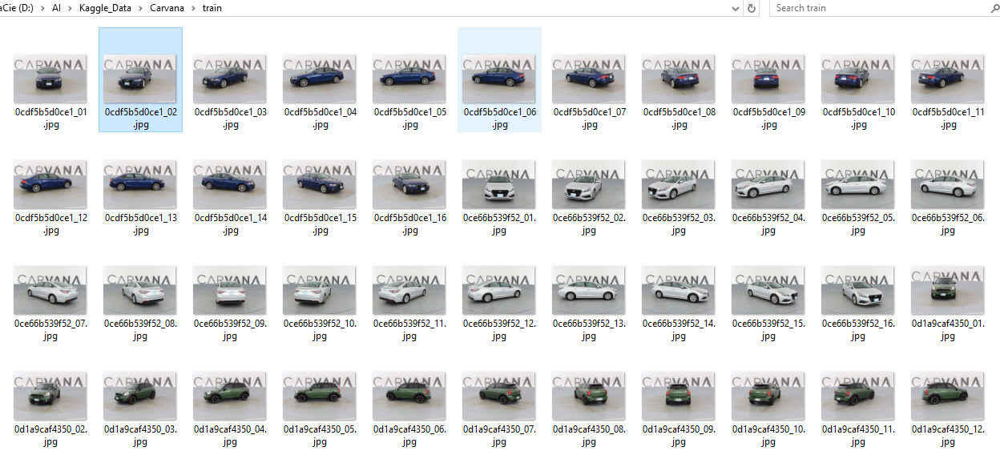

- ### `.convert("L")`
    - it converts the image to grayscale by converting it to a single-channel image where each pixel represents the luminance or brightness of the original image.

In [ ]:
import numpy as np
from torch.utils.data import Dataset
import os
from PIL import Image

In [ ]:
class CarvanaDataset(Dataset):
    def __init__(self,image_dir, mask_dir, transform=None):
        self.image_dir = image_dir
        self.mask_dir = mask_dir
        self.transform = transform
        self.images = os.listdir(self.image_dir)
    
    #return length of image
    def __len__(self):
        return len(self.images)
    
    def __getitem__(self,index):
        # return the image
        image_path = os.path.join(self.image_dir, self.images[idx])
        # return the mask image which is gif image
        mask_path = os.path.join(self.mask_dir, self.images[idx].replace(".jpg", "_mask.gif"))
        
        ##### Convert the PIL Image into np array
        image = np.array(Image.open(image_path).convert("RGB")) #make sure the image is loaded as RGB format
        mask = np.array(Image.open(mask_path).convert("L"))  #convert the image into gray one channel image
        
        # this is using to modify the image, resize, crop or rotate...
        if self.transform is not None:
            augmentation = self.transform(image= image, mask = mask)
            image = augmentation["image"]
            mask  = augmentation["mask"]
        
        return image,mask

## 3. Train.py

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import albumentations as A
from albumentations.pytorch import ToTensorV2
from tqdm import tqdm
#from model import UNet
#from utils import get_loader
import numpy as np
import random

In [ ]:
# training Parapeters
LEARNING_RATE = 1e-8
BATCH_SIZE = 8
NUM_EPOCH = 2
NUM_WORKERS = 2
PIN_MEMORY = True
LOAD_MODEL =False
DEVICE ="cuda" if torch.cuda.is_available() else "cpu"
print(DEVICE)

In [ ]:
TRAIN_IMG_DIR = r"D:\AI\Kaggle_Data\Carvana\trains"
TRAIN_MASK_DIR = r"D:\AI\Kaggle_Data\Carvana\train_masks"
VAL_IMG_DIR = r"D:\AI\Kaggle_Data\Carvana\vals"
VAL_MASK_DIR = r"D:\AI\Kaggle_Data\Carvana\val_masks"

#original images are too big (1980 x 1280), need to be resized to this size below
IMAGE_WIDTH=240
IMAGE_HEIGHT=160

train_losses =[]
val_acc=[]
val_dice=[]

In [ ]:
# set random seed to make sure get real random data
seed = random.randint(1,100)
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
# if multiple GPU are used
#torch.cuda.manual_seed_all(seed)

np.random.seed(seed)
random.seed(seed)

torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

In [ ]:
def train_fn(loader, model, loss_fn, optimizer, scaler):
    loop = tqdm(loader)
    total_loss=0.0
    for index ,(data,target) in enumerate(loop):
        data = data.to(DEVICE)
        target = target.unsqueeze(1).float().to(DEVICE)
        ################################################
        # one training is finished by the code below
        ################################################
        with torch.cuda.amp.autocast():
            predict = model(data)
            loss = loss_fn(predict, target)
        
        # clear the optimizer to prevent from overloaded
        optimizer.zero_grad()
        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()
        
        total_loss += loss.item()
        
        loop.set_postfix(loss=loss.item())
        
    return total_loss / len(loader)

### 4. Utils.py

In [ ]:
import torch
import torchvision
#from dataset import CarvanaDateset
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt

In [ ]:
def get_loaders(train_img_dir, train_mask_dir, val_img_dir, val_mask_dir, 
                train_transform, val_transform, 
                batch_size, num_workers, pin_memory=True):
    
    train_ds = CarvanaDataset(image_dir=train_img_dir, mask_dir = train_mask_dir, transform = train_transform)
    val_ds = CarvanaDataset(image_dir=val_img_dir, mask_dir = val_mask_dir, transform = val_transform)
    
    train_loader = DataLoader(train_ds, batch_size=batch_size, num_workers = num_workers, pin_memory=pin_memory)
    val_loader = DataLoader(val_ds, batch_size=batch_size, num_workers = num_workers, pin_memory=pin_memory)
    
    return train_loader, val_loader

### 5. Accuracy

In [ ]:
def check_accuracy(loader, model, DEVICE="cuda"):
    num_correct=0
    num_pixels=0
    dice_score=0
    model.eval()
    
    #Lock parameter when checking accuracy
    with torch.no_grad(): 
        for x,y in loader:
            x = x.to(DEVICE)
            y = y.unsqueeze(1).to(DEVICE)
            predictions = torch.sigmoid(model(x))
            predictions = (predictions>0.5).float()
            num_correct += (predictions==y).sum()
            num_pixels += torch.numel(predictions)
            dice_score += (2*(predictions*y).sum()) / (2*(predictions * y).sum() + ((predictions*y)<1).sum())
    
    accuracy = round(float(num_correct / num_pixels),4)
    dice = round(float(dice_score/len(loader)),4)
    print(f"Got {num_correct} / {num_pixels} with acc {num_correct / num_pixels*100 :.2f}")
    print(f"Dice Score: {dice_score/len(loader)}")
    
    #Switch back to train model after all parameters are checked (calculated)
    model.train()
    
    return accuracy, dice

### main.py

In [ ]:
def main():
    train_transform = A.Compose(
        [
            A.Resize(height=IMAGE_HEIGHT, width = IMAGE_WIDTH),
            A.Rotate(limit=35, p=1.0),
            A.HorizontalFlip(p=0.5),
            A.VerticalFlip(p=0.1),
            A.Normalize(
                mean=[0.0,0.0,0.0],
                std=[1.0,1.0,1.0],
                max_pixel_value=255.0
            ),
            ToTensorV2()
        ]
    )
    
    # validation doesn't need rotate and flips
    val_transform =  A.Compose(
        [
            A.Resize(height=IMAGE_HEIGHT, width = IMAGE_WIDTH),
            A.Normalize(
                mean=[0.0,0.0,0.0],
                std=[1.0,1.0,1.0],
                max_pixel_value=255.0
            ),
            ToTensorV2()
        ]
    )
    
    train_loader, val_loader = get_loaders (TRAIN_IMG_DIR, TRAIN_MASK_DIR, VAL_IMG_DIR,VAL_MASK_DIR,
                                          train_transform, val_transform,
                                          BATCH_SIZE, NUM_WORKERS,PIN_MEMORY)
    
    model = Unet(in_channel=3, out_channel=1).to(device=DEVICE)
    loss_fn = nn.BCEWithLogitsLoss()
    optimizer = optim.Adam(model.parameters(), lr = LEARNING_RATE)
    scaler = torch.cuda.amp.GradScaler()
    
    for index in range(NUM_EPOCH):
        print("Current Epotch: ", index)
        train_loss = train_fn(train_loader,model,loss_fn,optimizer,scaler)
        train_losses.append(train_loss)
        
        accuracy,dice=check_accuracy(val_loader, model, DEVICE=DEVICE)
        val_acc.append(accueacy)
        val_dice.append(dice)

In [ ]:
if __name__ == "__main__":
    main()

## Debug Cases

### Check input images and target in one batch
- for sets in one batch
- input images are 3 channel rgb color images
- target images are one channel mask images

In [21]:
import numpy as np
import matplotlib.pyplot as plt

In [20]:
data = np.load(r'D:\Python\unet_carvana\data.npy')
# convert shape from 4,3,160,240 to current, in order to display image in h,w,rgb order
data = data.transpose(2,3,1,0)
data.shape

(160, 240, 3, 4)

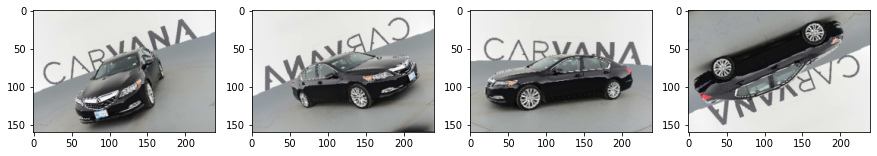

In [12]:
fig, axes = plt.subplots(1, 4, figsize=(15, 5)) 
axes[0].imshow(data[:,:,:,0])
axes[1].imshow(data[:,:,:,1])
axes[2].imshow(data[:,:,:,2])
axes[3].imshow(data[:,:,:,3])

In [16]:
target = np.load(r'D:\Python\unet_carvana\target.npy')
target.shape

(4, 160, 240)

In [17]:
target = target.transpose(1,2,0)
target.shape

(160, 240, 4)

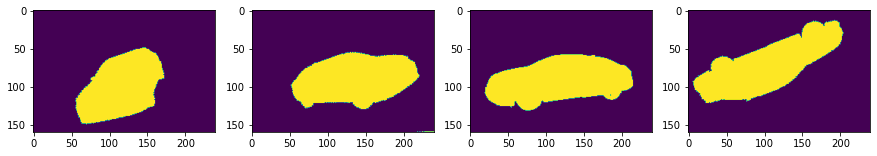

In [19]:
fig, axes = plt.subplots(1, 4, figsize=(15, 5)) 
axes[0].imshow(target[:,:,0])
axes[1].imshow(target[:,:,1])
axes[2].imshow(target[:,:,2])
axes[3].imshow(target[:,:,3])

#### Found predict returns nan array
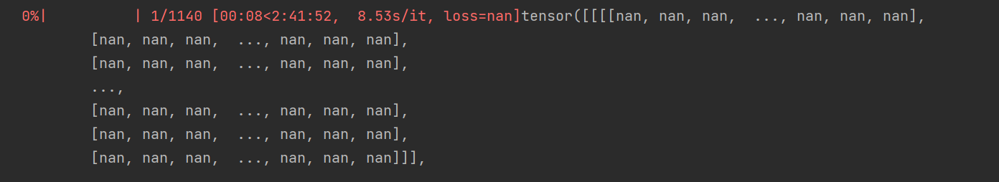

In [26]:
data = np.load(r'D:\Python\unet_carvana\1-before2nConv.npy')
# convert shape from 4,3,160,240 to current, in order to display image in h,w,rgb order
data = data.transpose(2,3,1,0)
data.shape

(480, 720, 64, 4)

In [37]:
img = data[:,:,0,0]
img.shape

(480, 720)

In [38]:
img.dtype

dtype('float16')

In [30]:
plt.imshow(img)

ValueError: Unsupported dtype

<Figure size 432x288 with 1 Axes>

In [27]:
fig, axes = plt.subplots(1, 4, figsize=(15, 5)) 
axes[0].imshow(data[:,:,0,0])
axes[1].imshow(data[:,:,0,1])
axes[2].imshow(data[:,:,0,2])
axes[3].imshow(data[:,:,0,3])

ValueError: Unsupported dtype

<Figure size 1080x360 with 4 Axes>

# GTX1660ti claim support FP16, but this code didn't work
# Code runs ok after switched to RTX3060

## Train Progress

### 1. Training Images:  4557 images
- Images
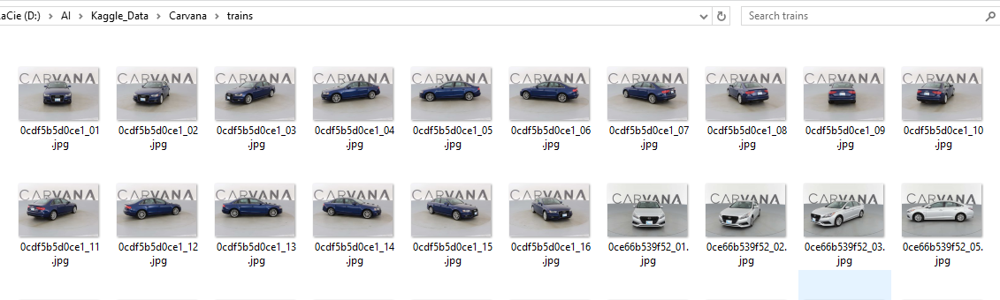

- #### BATCH_SIZE = 48
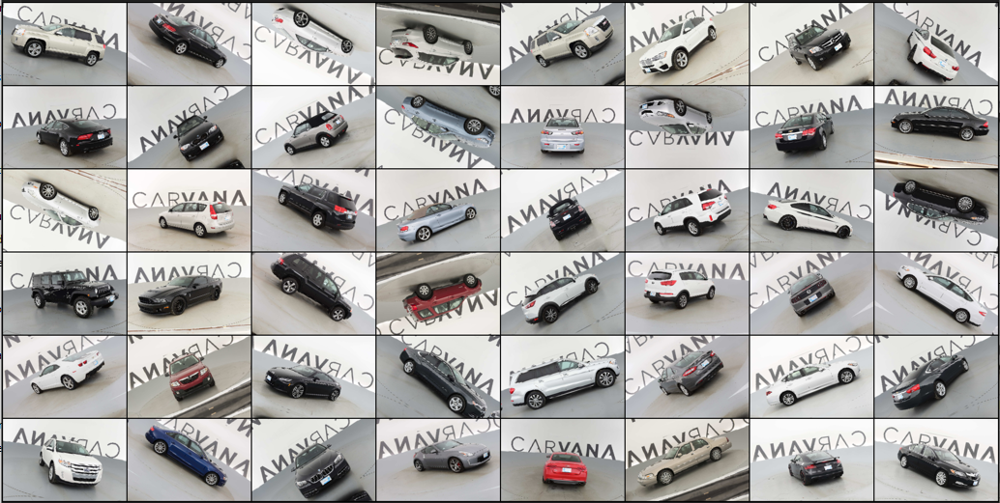

- #### Batches (sets) = 4557 / 48 = 94.93 sets (larget image sets)
    - Epoch 0, first batch - 0 set
    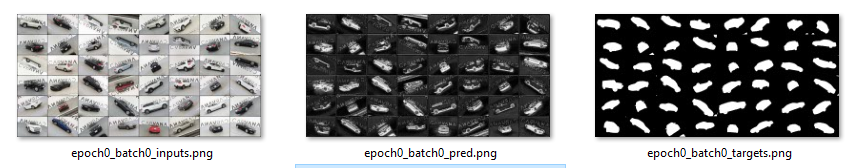

    - Epoch 0, last batch - 94 set (start from 0, this is the 95th)
    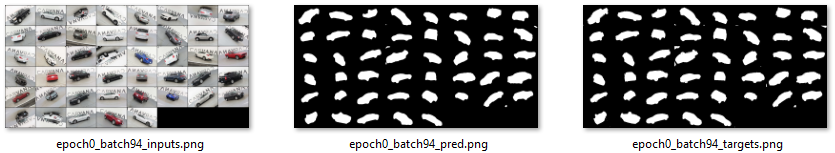

   - Epoch 1, first batch - 0 set
    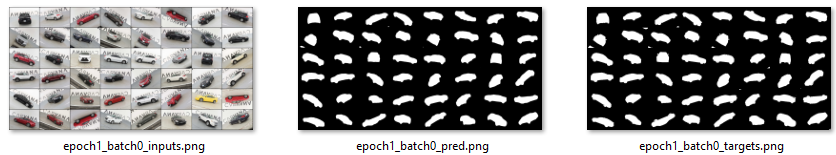

   - Epoch 1, last batch - 94 set (start from 0, this is the 95th)
   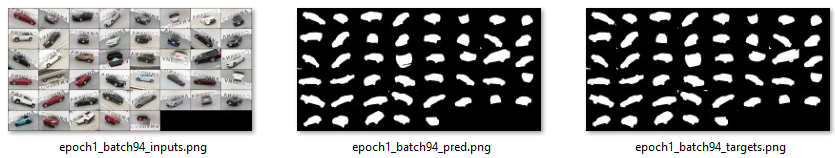

   - Epoch 4, first batch - 0 set
    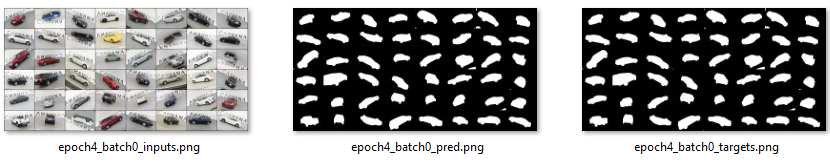

   - Epoch 4, last batch - 94 set (start from 0, this is the 95th)
    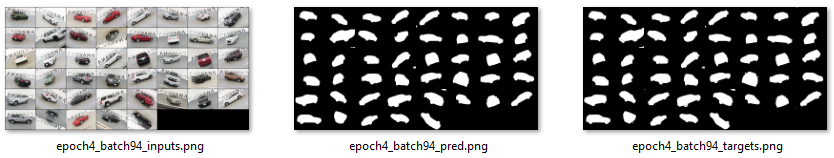

### Changes from first couple of batches

- batch: 0
    - Target:
    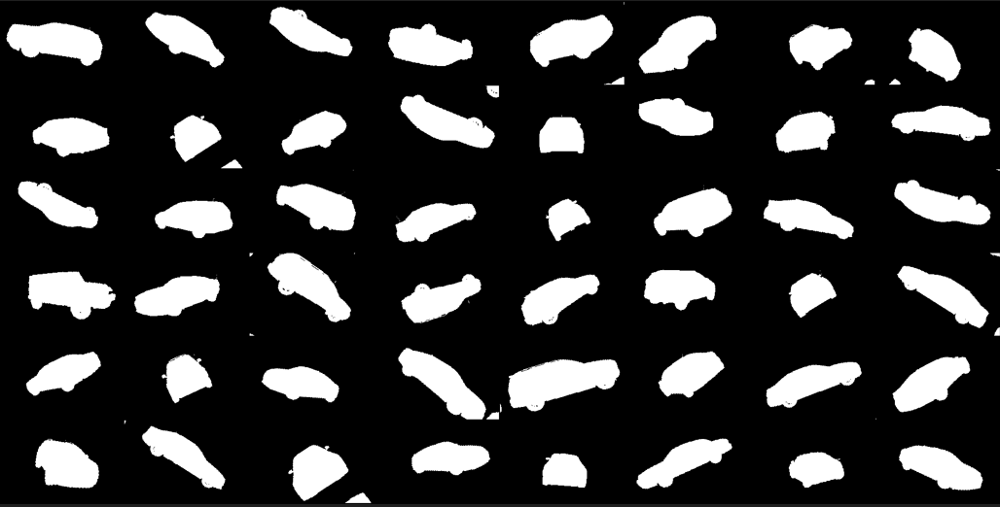
    
    - predicted (during training)
    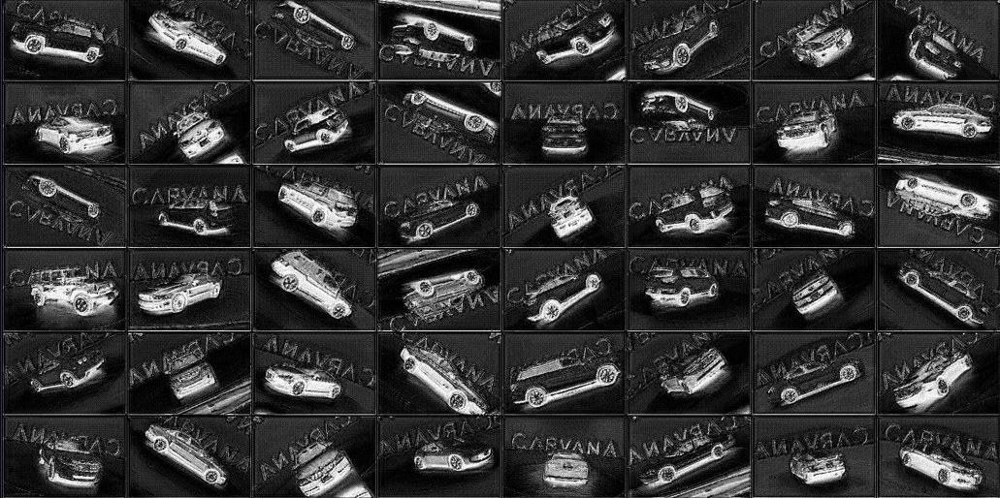


- batch: 1
    - Target:
    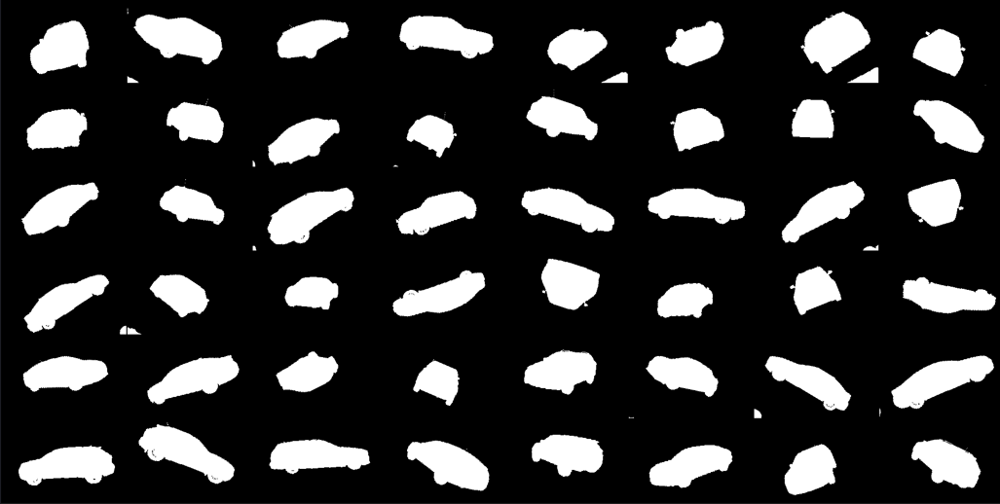
    
    - predicted (during training)
    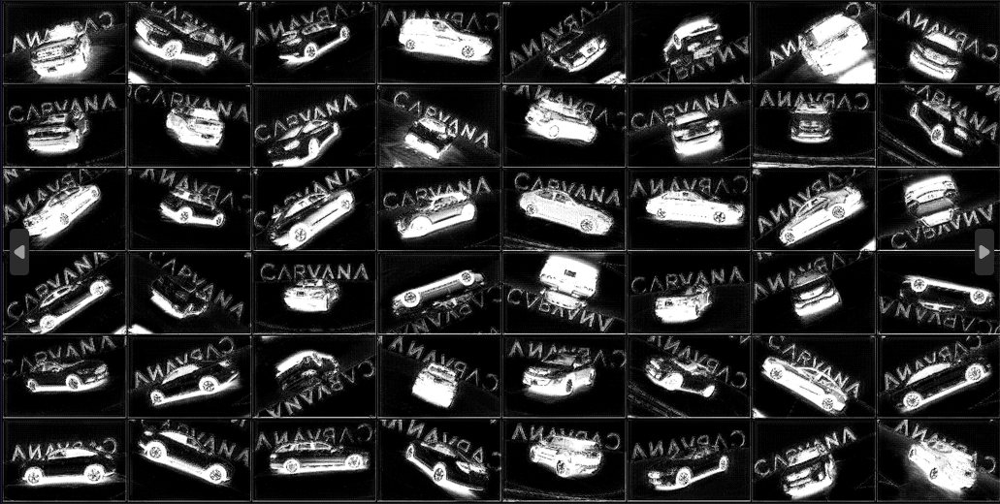



- batch 10
    - Target:
    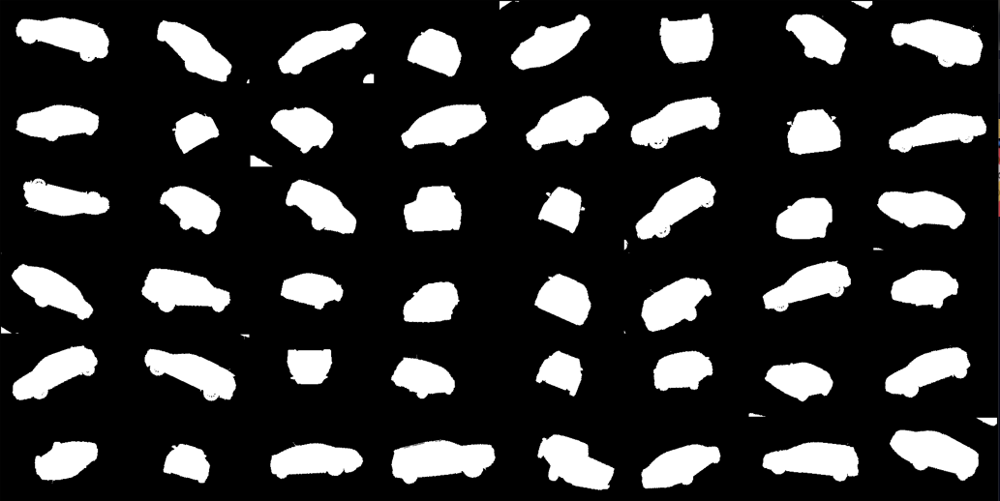
    
    - predicted (during training)
    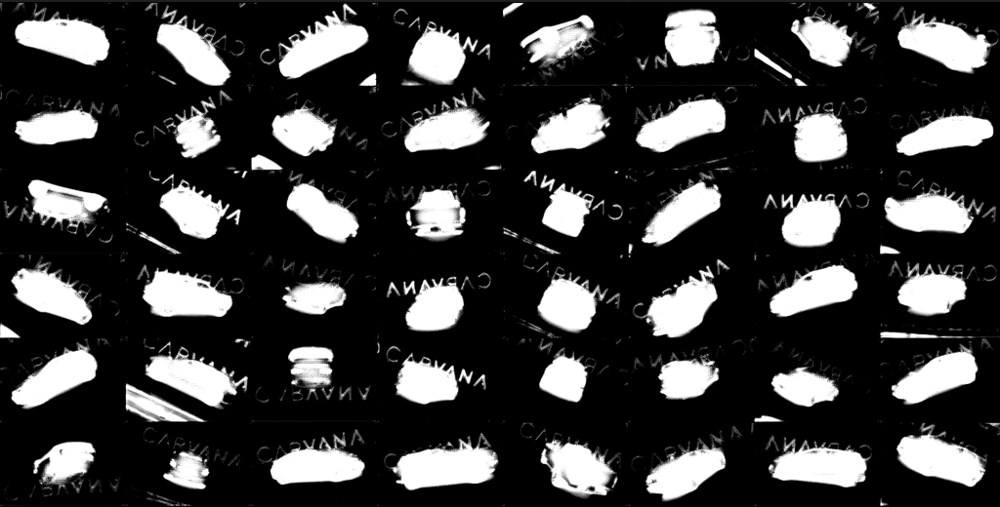


- batch 20
    - Target:
    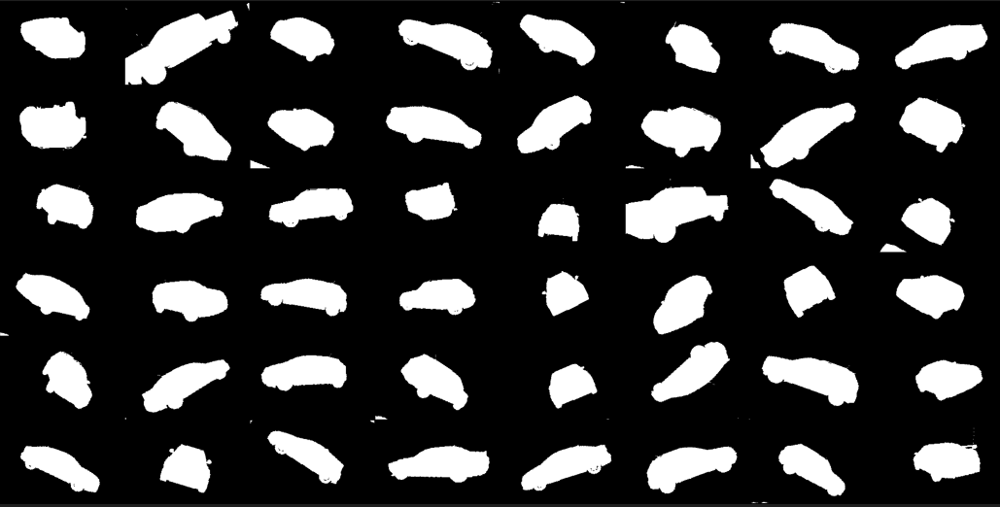
    
    - predicted (during training)
    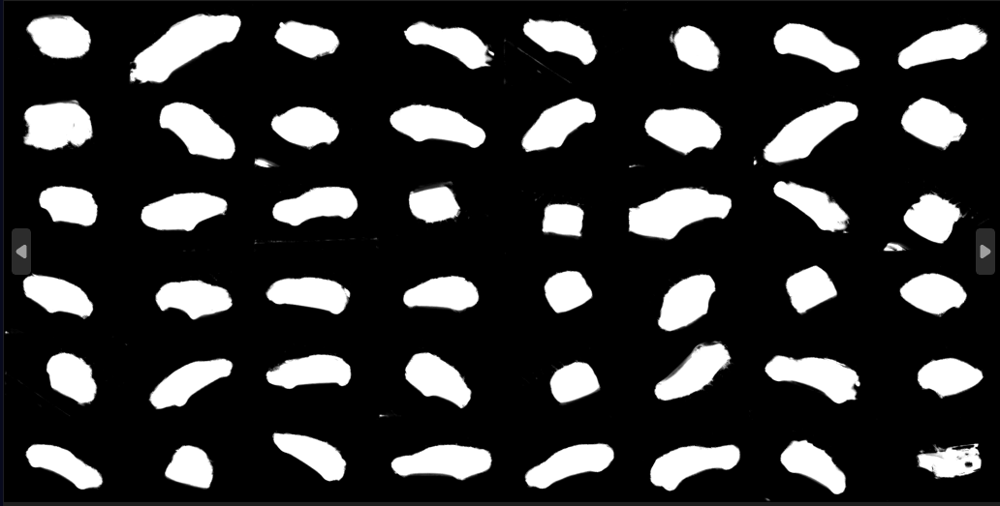


- batch 30
    - Target:
    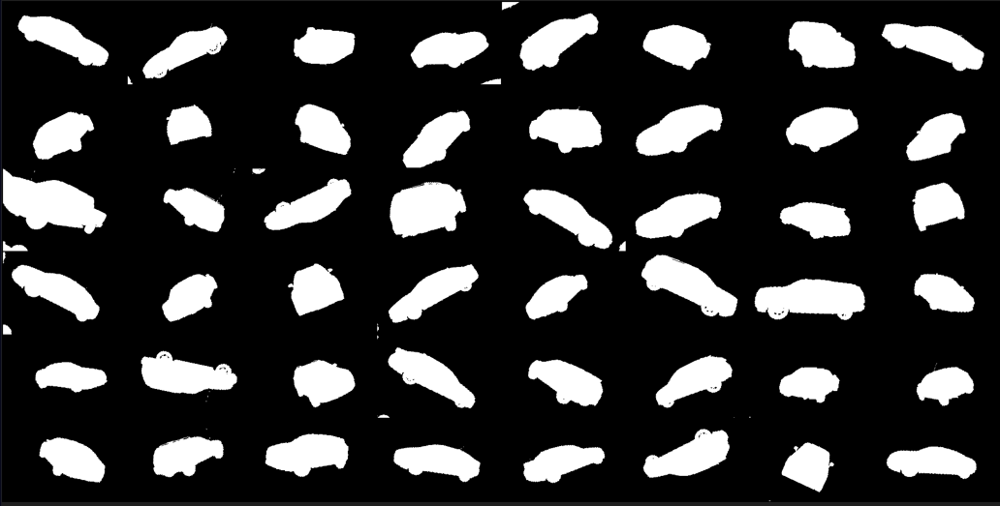
    
    - predicted (during training)
    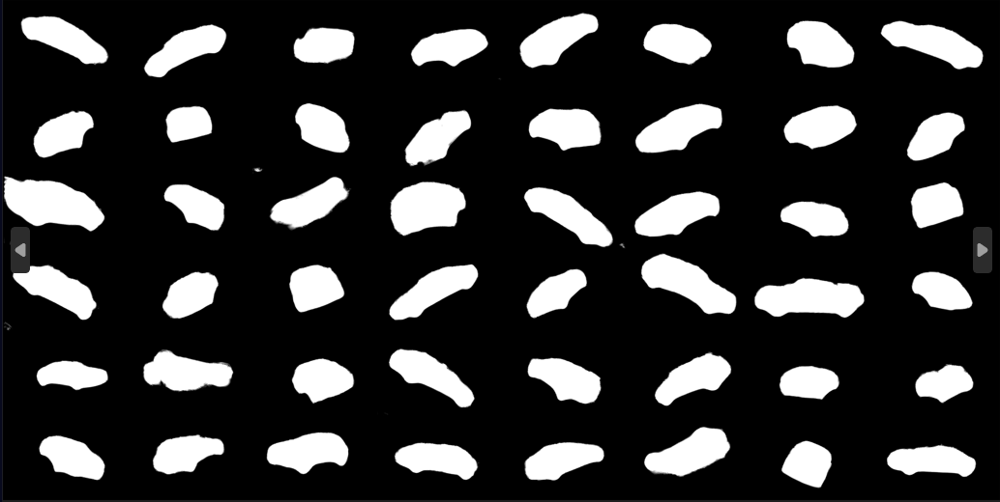


- batch 80
    - Target:
    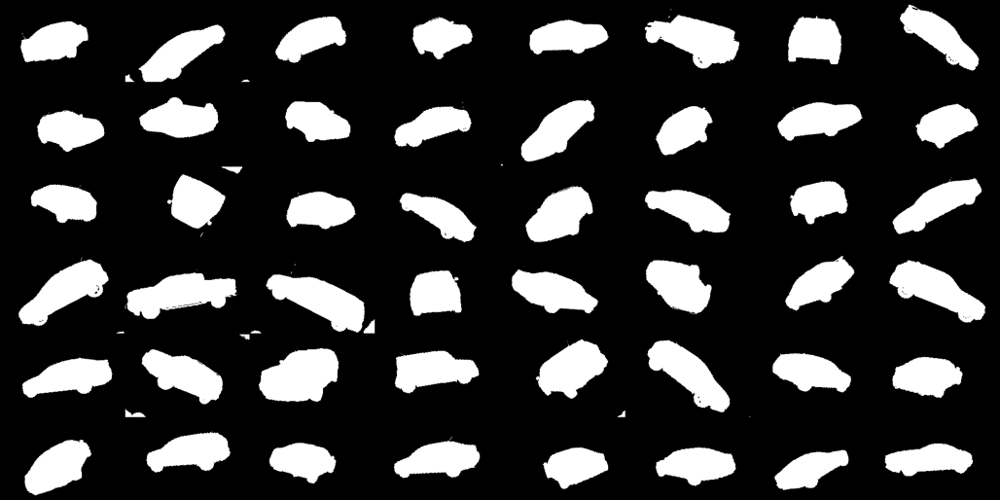    
    - predicted (during training)
    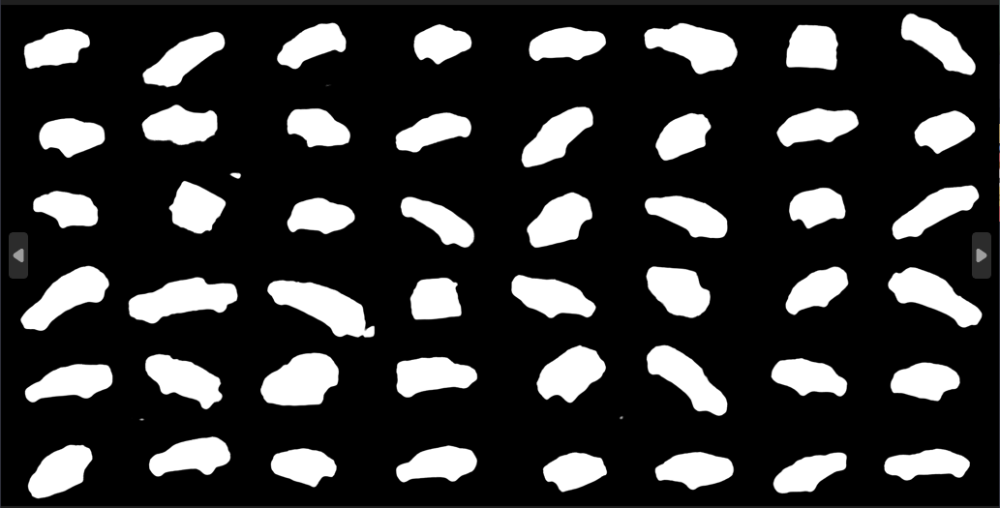


- batch 94
    - Target:
    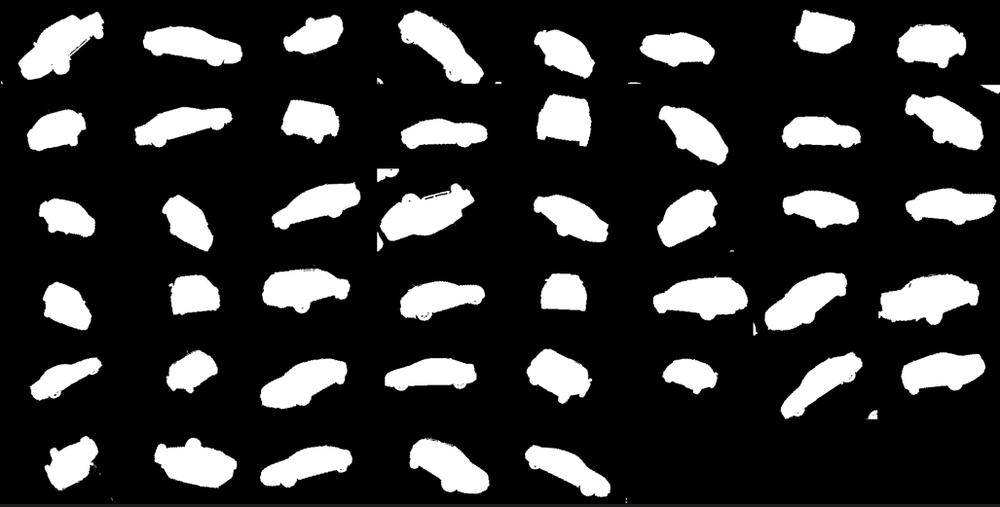    
    
    - predicted (during training)
    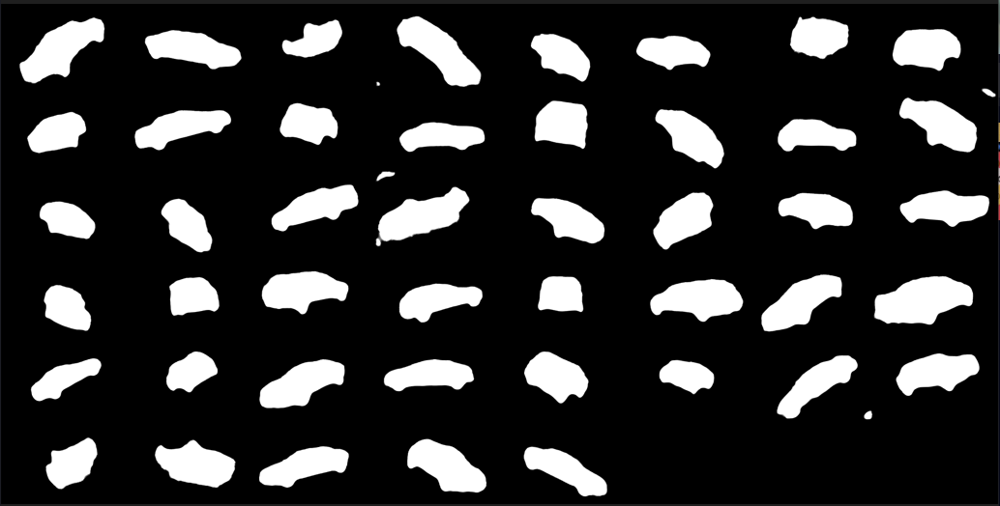

- Epoch 4, batch 0
    - Target:
    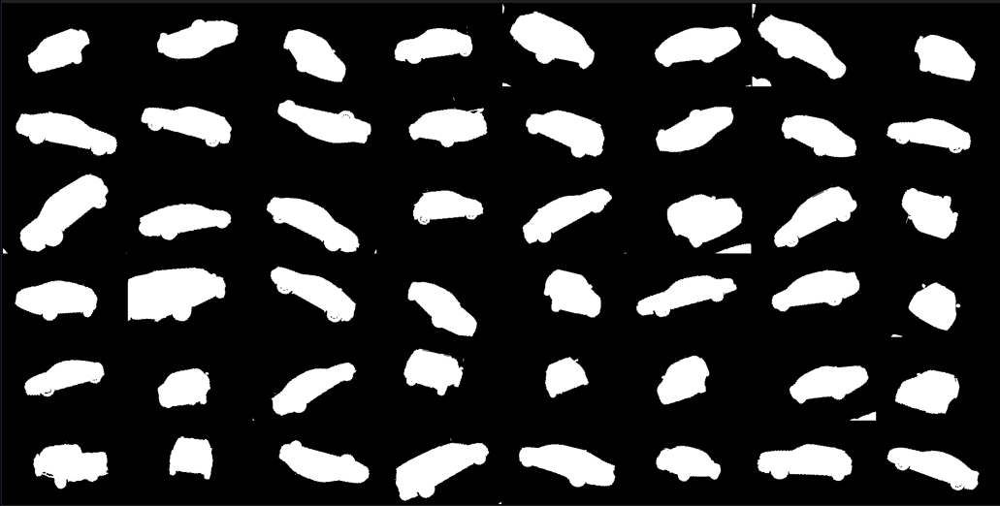
    
    - predicted (during training)
    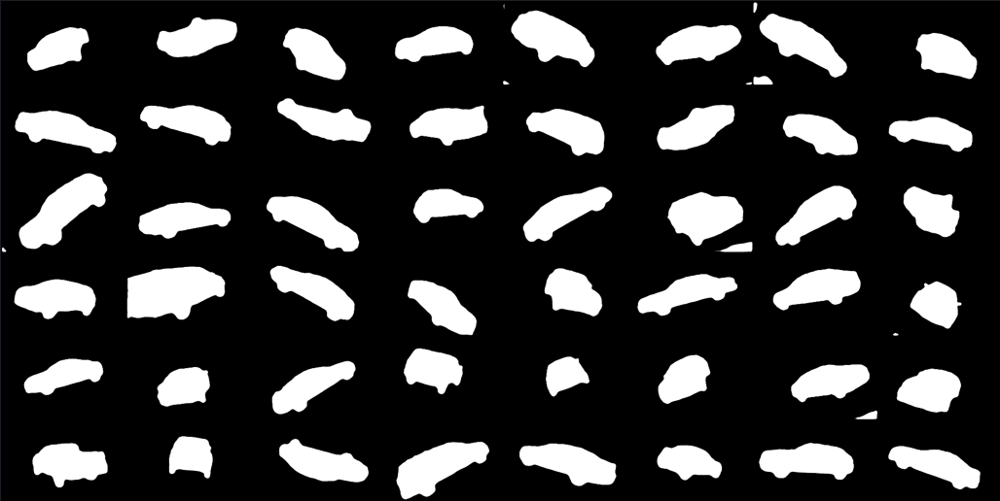
    
    
- Epoch 4, batch 94 (last one in all)
    - Target:
    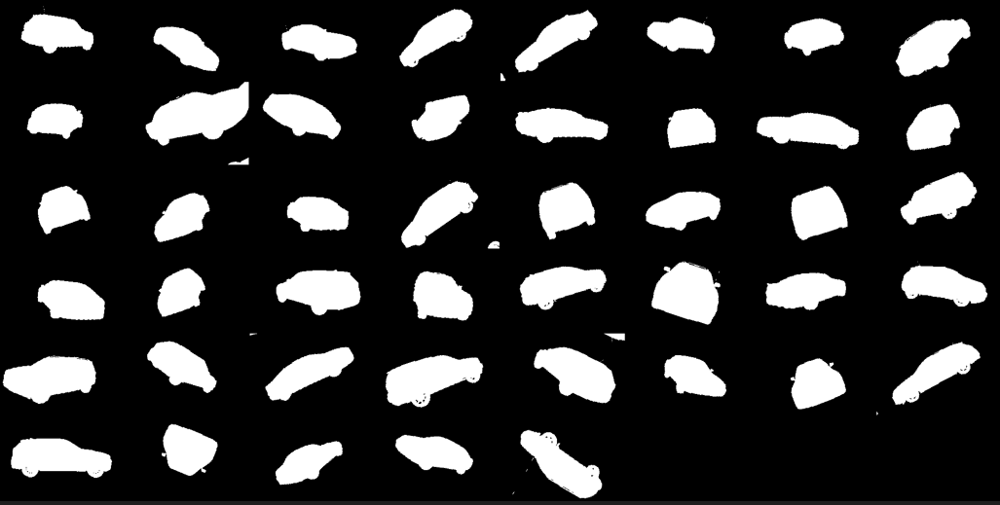
    
    - predicted (during training)
    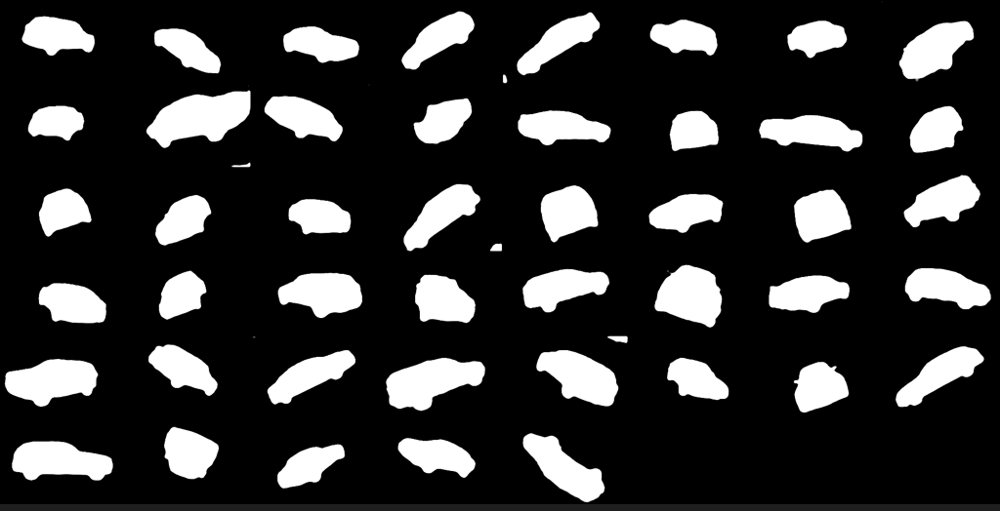

#### Like wheels, they are not perfect yet

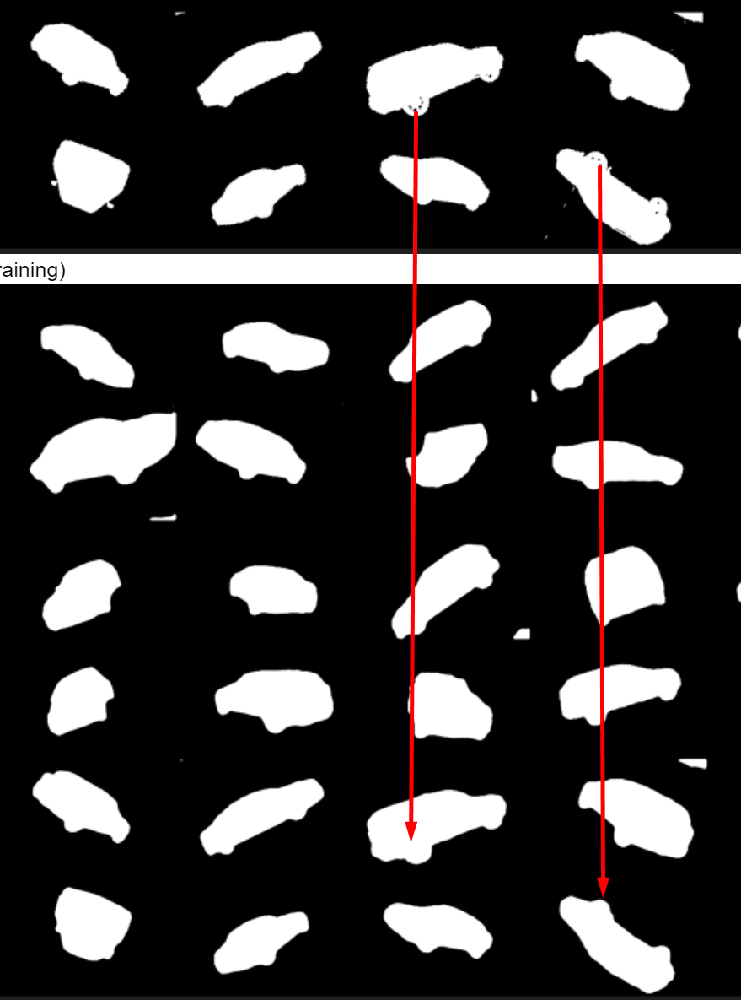

### Difference between Conv2d and Conv3d

- #### Conv2d: Conv2d operates on 2D data, such as images, and slides over the height and width dimensions.

This layer is designed to operate on 2D input data, typically used for processing images.  The input data is assumed to have a shape of 
   - **[batch_size, channels, height, width]**, where 
       - batch_size is the number of samples in the batch, 
       - channels is the number of channels in each image (e.g., 3 for RGB), 
       - height is the height of the image, 
       - and width is the width of the image. 
    
The convolutional kernel slides over the spatial dimensions (height and width) of the input data.

- #### Conv3d: Conv3d operates on 3D data, such as video sequences or volumetric images, and slides over the depth, height, and width dimensions

    This layer, on the other hand, operates on 3D input data, commonly used for processing **volumetric data such as video sequences or medical imaging data**. The input data is assumed to have a shape of 
    - **[batch_size, channels, depth, height, width]**, where 
        - depth represents the depth or temporal dimension (e.g., number of frames in a video). 

The convolutional kernel slides over all three spatial dimensions (depth, height, and width) of the input data.

## Training Major Steps

### 1. Define train and val Transform to change the input images
- `train_transform =`
- `val_transform =`

### 2. Define model
- `model = UNET(in_channels=3, out_channels=1).to(DEVICE)`
    
### 3. Define loss function and optimizer
- `loss_fn = nn.BCEWithLogitsLoss()`
- `optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE)`
    
### 4. Define train_loader and val_loader
- `train_loader, val_loader = get_loaders(`

### 5. define scaler
- Automatic Mixed Precision Training
    - `scaler = torch.cuda.amp.GradScaler()`

### 6. Loop through every epoch and inside LOOP

#### 6.1  Run Train function
- `train_fn(train_loader, model, optimizer, loss_fn, scaler,epoch)`
    
#### 6.2 define check_point and save current weights
- `checkpoint = {
            'state_dict': model.state_dict(),
            'optimizer': optimizer.state_dict(),
        }
        save_checkpoint(checkpoint, filename='model_2.pth.tar')`
#### 6.3  check accuracy
- `check_accuracy(val_loader, model, device=DEVICE)`
    
#### 6.4  print some examples to a folder
- `save_prediction_as_imgs(
            val_loader, model, epoch, folder="saved_images/", device=DEVICE
        )`

### 7. train_fn Function
- train_fn(loader, model, optimizer, loss_fn, scaler,epo)
    - loader: is traning loader
    - model: predefined UNet
    - optimizer: pre-defined optimizer
    - loss_fn: pre-defined loss functrion
    - scaler: pre-defined scaler functrion
    - epo: current epoch number, this is added for saving predicted images during training
    
#### 7.1 convert loader to tqdm, which can show traning progress
- `loop = tqdm(loader)`

#### 7.2 Loop through data in data loader
- `for batch_idx, (data, targets) in enumerate(loop):`
    - batch_idx: is current batch number. loop throgh all each data in current batch
    - data:  is current input data
        - `data = data.to(device=DEVICE)`
    - targets: the input data should be trained(predicted) like targets through model 
        - `targets = targets.float().unsqueeze(1).to(device=DEVICE)`
        - unsqueeze(1) adds one extra empty dimesion to meet the shape needs
    - Calculate prediction:
        - `with torch.cuda.amp.autocast():`
            - calcualte predicted data from model: `predictions = model(data)`
            - calculate loss: `loss = loss_fn(predictions, targets)`
    - Standard operation afdter predict:
        - `optimizer.zero_grad()`
        - `scaler.scale(loss).backward()`
        - `scaler.step(optimizer)`
        - `scaler.update()`
    - save loss number to tqdm progress bar
        - `loop.set_postfix(loss=loss.item())`
        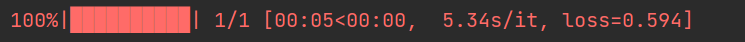

### 1st Batch

#### Input data (total 48 images)
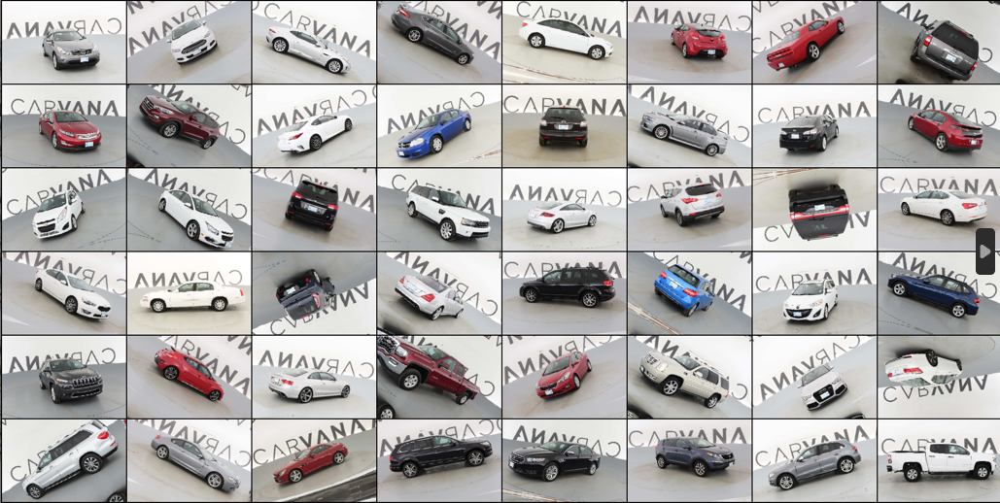

#### targets
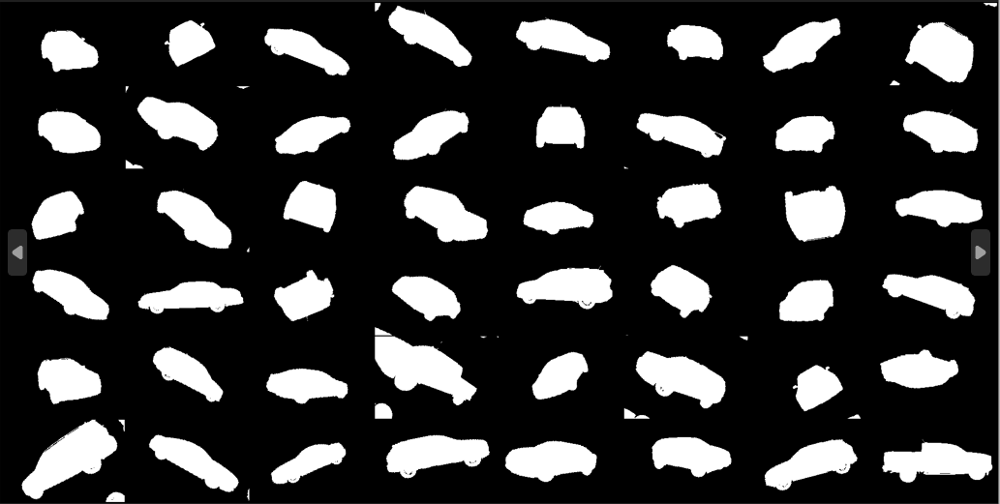

#### Predicted after 1st batch run
    - still looks like input images
    - will look more like targets after many epoch and batches training
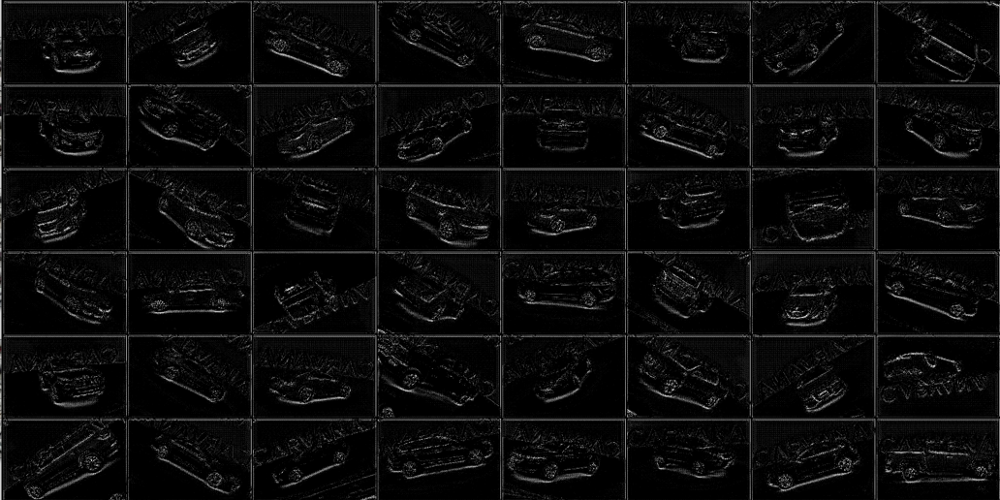

### 10 epochs

#### Input data (total 48 images)
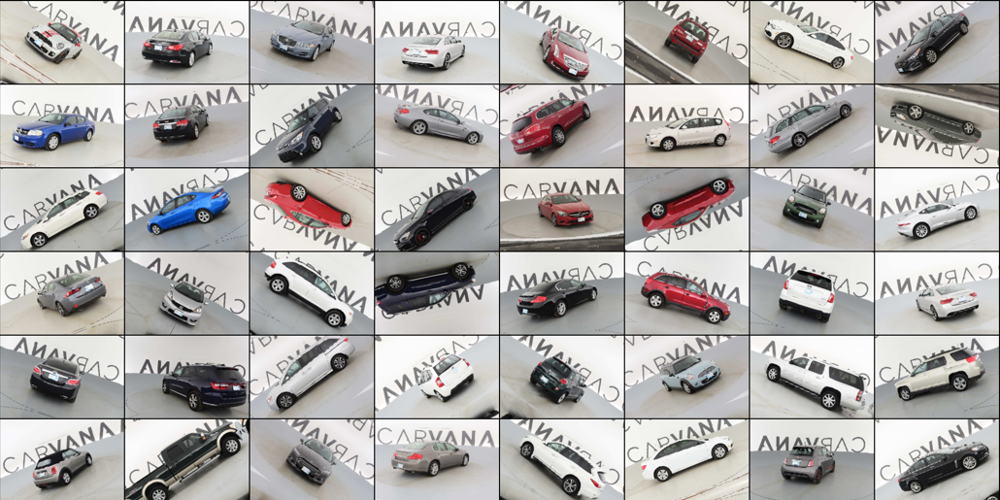

#### targets
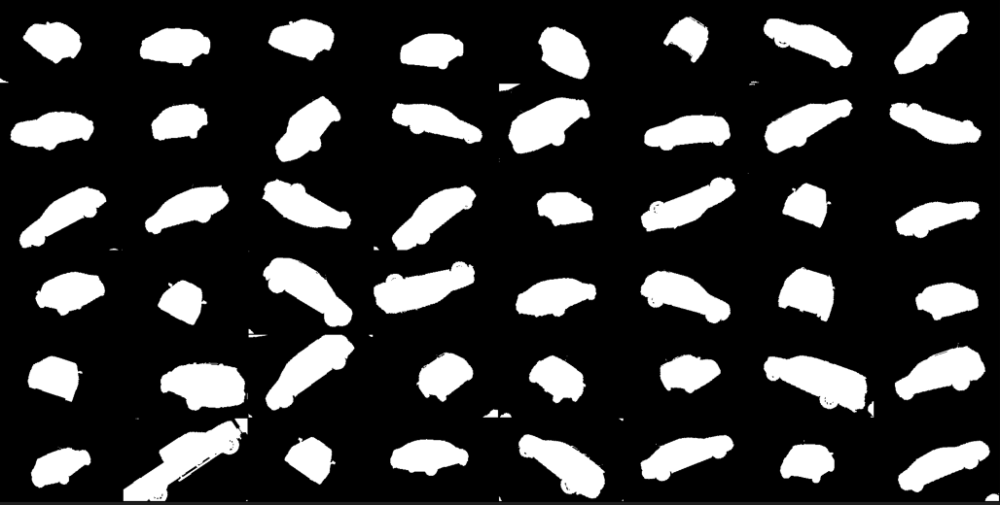

#### Predicted after 10 epochs run
    - looks more like target images,
    - (if there are less images) background texts still can be seen
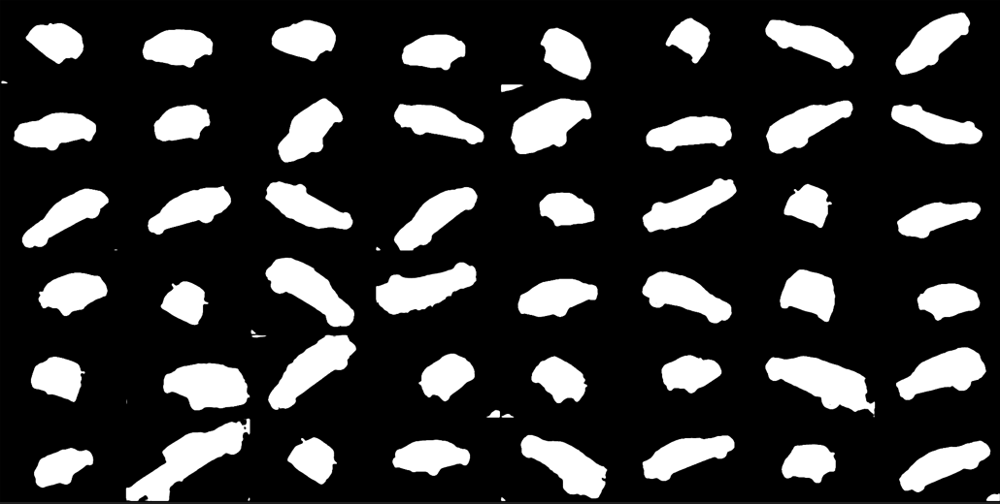

### 30 epochs

#### Input data (total 48 images)
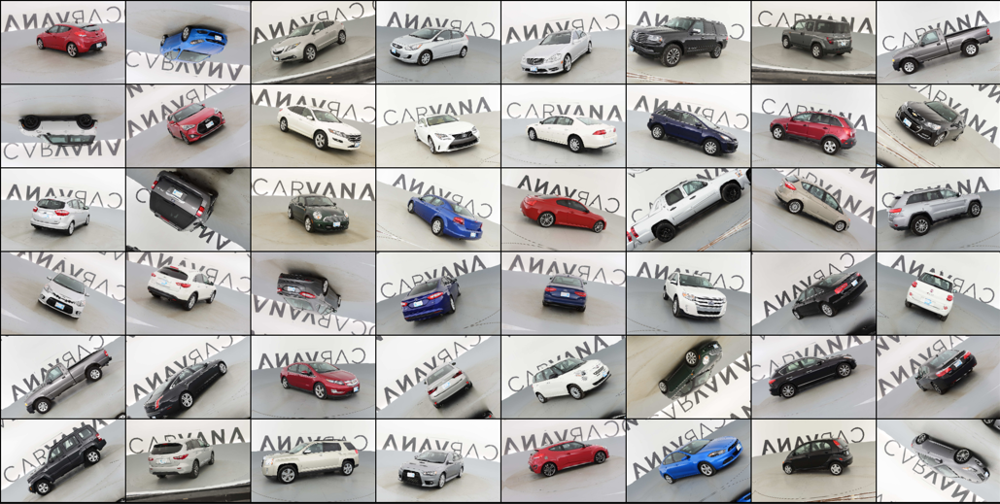

#### targets
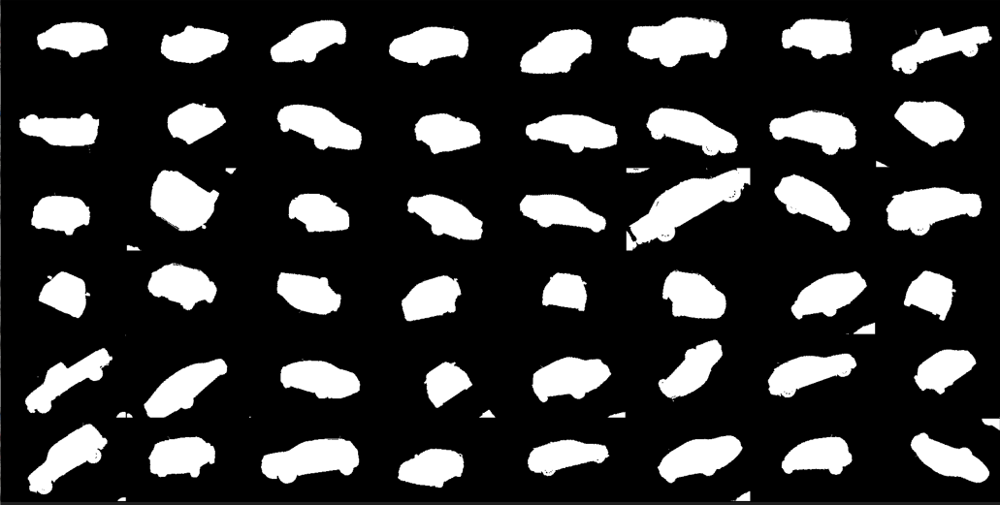

#### Predicted after 10 epochs run
    - very close to target    
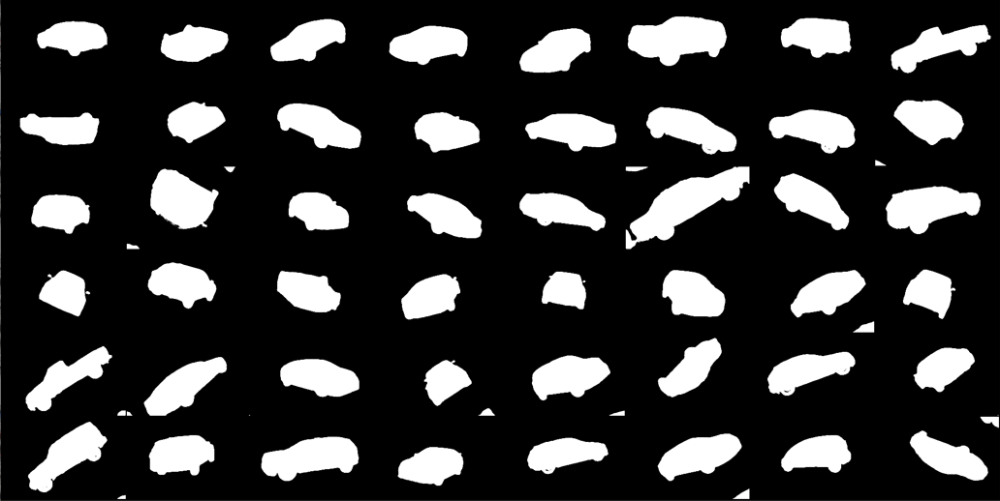

### Inference (inference.py)
- change the model to latest model check point save at root( not in model folder)
    - `model_path = 'model/model_30epoch.pth.tar'`
- other parameters:
    - original image: `image_path = '0ee135a3cccc_02.jpg'`
    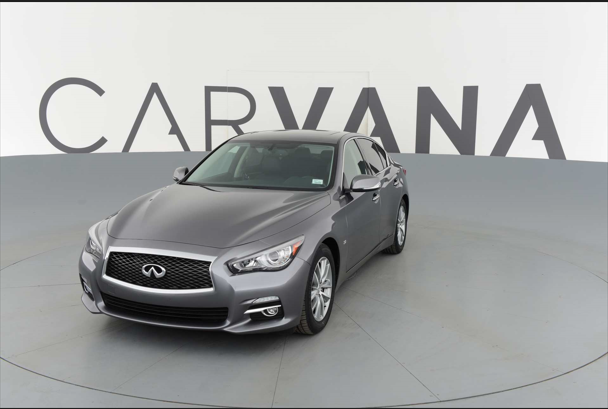
    
    - predicted mask for this input: `torchvision.utils.save_image(preds, "pred.png")`
    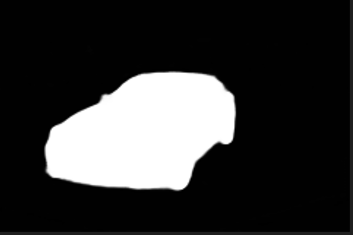
    
    - overlap mask on original image: `cv2.imwrite('masked_car_w.jpg', masked_car_w)`
    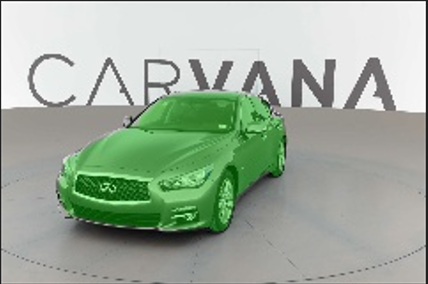

### Display Trainied Model (weights) 
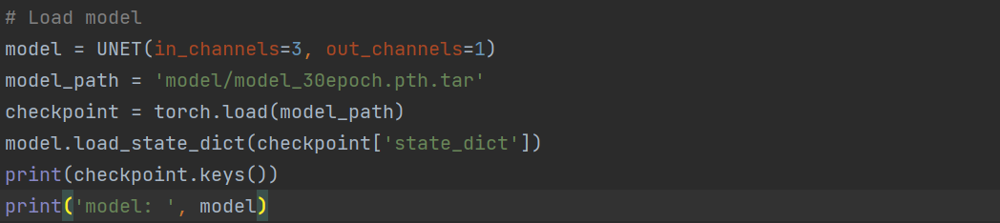
- dict_keys(['state_dict', 'optimizer'])
- Model: Overview

#### (downs): ModuleList(
- Down1: 3 in_channels, 64 out_channels: *64, represents the number of output channels or feature maps. Each feature map is a two-dimensional array produced by the convolution operation*
    - `(0): DoubleConv(
      (conv): Sequential(
        (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
        (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (5): ReLU(inplace=True)
      )
    )`
- Down2: 
    - 1st Conv2d: 64 in_channels, 128 out_channels
    - 2nd Conv2d (in 128, out 128)
    - `(1): DoubleConv(
      (conv): Sequential(
        (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
        (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (5): ReLU(inplace=True)
      )
    )`
    
- Down3: 128 in_channels, 256 filters
    - (2): DoubleConv(
      (conv): Sequential(
        (0): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
        (3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (5): ReLU(inplace=True)
      )
    )

...

In [ ]:
model:  UNET(
  (ups): ModuleList(
    (0): ConvTranspose2d(1024, 512, kernel_size=(2, 2), stride=(2, 2))
    (1): DoubleConv(
      (conv): Sequential(
        (0): Conv2d(1024, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
        (3): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (4): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (5): ReLU(inplace=True)
      )
    )
    (2): ConvTranspose2d(512, 256, kernel_size=(2, 2), stride=(2, 2))
    (3): DoubleConv(
      (conv): Sequential(
        (0): Conv2d(512, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
        (3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (5): ReLU(inplace=True)
      )
    )
    (4): ConvTranspose2d(256, 128, kernel_size=(2, 2), stride=(2, 2))
    (5): DoubleConv(
      (conv): Sequential(
        (0): Conv2d(256, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
        (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (5): ReLU(inplace=True)
      )
    )
    (6): ConvTranspose2d(128, 64, kernel_size=(2, 2), stride=(2, 2))
    (7): DoubleConv(
      (conv): Sequential(
        (0): Conv2d(128, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
        (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (5): ReLU(inplace=True)
      )
    )
  )
  (downs): ModuleList(
    (0): DoubleConv(
      (conv): Sequential(
        (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
        (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (5): ReLU(inplace=True)
      )
    )
    (1): DoubleConv(
      (conv): Sequential(
        (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
        (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (5): ReLU(inplace=True)
      )
    )
    (2): DoubleConv(
      (conv): Sequential(
        (0): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
        (3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (5): ReLU(inplace=True)
      )
    )
    (3): DoubleConv(
      (conv): Sequential(
        (0): Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
        (3): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (4): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (5): ReLU(inplace=True)
      )
    )
  )
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (bottleneck): DoubleConv(
    (conv): Sequential(
      (0): Conv2d(512, 1024, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): Conv2d(1024, 1024, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (4): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU(inplace=True)
    )
  )
  (final_conv): Conv2d(64, 1, kernel_size=(1, 1), stride=(1, 1))
)
torch.Size([1, 3, 160, 240])

### Dataset
- `class CarvanaDataset(Dataset):`

#### 1. Core Function - Init, define dirs and transform
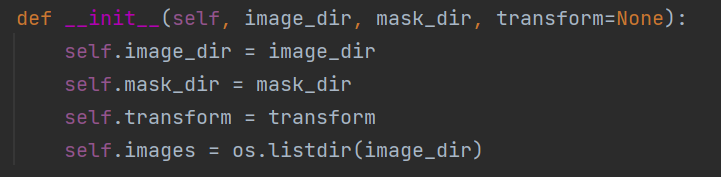

#### 2. Core Function -  return number of images
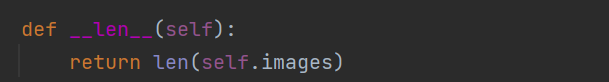

#### 3. Core Function -  return individual image by given index
- `def __getitem__(self, index):`
    - Get path for input images and target mask images
        - `img_path = os.path.join(self.image_dir, self.images[index])`
        - `mask_path = os.path.join(self.mask_dir, self.images[index].replace(".jpg", "_mask.gif"))`
    - Convert raw image to format needs
        - input images to RGB 3 channel images 
            - `image = np.array(Image.open(img_path).convert("RGB"))`
        - target image into one channel mask image
            - `mask = np.array(Image.open(mask_path).convert("L"), dtype=np.float32)`
        - Convert mask to 0,1
            - `mask[mask==255.0] = 1.0`
    - transform function to adjust image as needed
    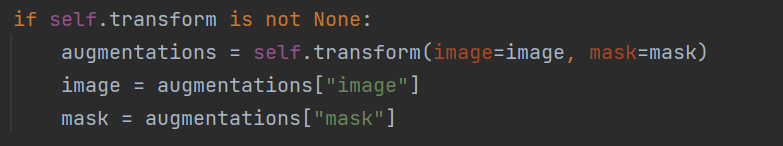
    
    - return image and mask

### Loader
- `def get_loaders(train_dir, train_maskdir, 
                val_dir, val_maskdir,
                batch_size, train_transform, val_transform,
                num_workers=4, pin_memory=True):`

#### Train Data:
####  1. Create train dataset
        - `train_ds = CarvanaDataset(
        image_dir=train_dir,
        mask_dir=train_maskdir,
        transform=train_transform
    )`
#### 2. Create train data loader from train dataset
        - `train_loader= DataLoader(
        train_ds,
        batch_size=batch_size,
        num_workers=num_workers,
        pin_memory=pin_memory,
        shuffle=True,
    )`
    
#### Val Data:
####  1. Create val dataset
        `val_ds = CarvanaDataset(
        image_dir=val_dir,
        mask_dir=val_maskdir,
        transform=val_transform
    )`
#### 2. Create val data loader from val dataset
        `val_loader= DataLoader(
        val_ds,
        batch_size=batch_size,
        num_workers=num_workers,
        pin_memory=pin_memory,
        shuffle=False,
    )`

## in/out Channels
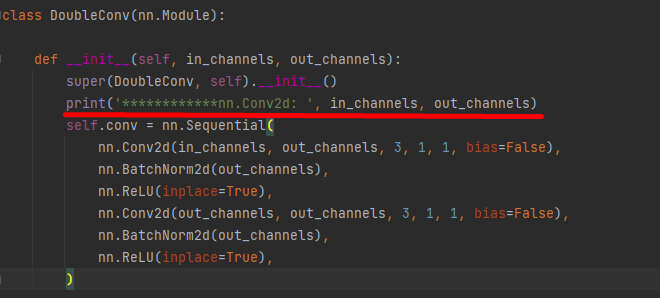

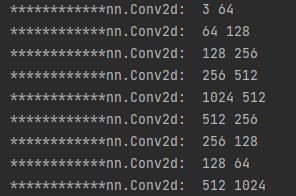

In [1]:
import numpy as np
import matplotlib.pyplot as plt

#### 1. Before DoubleConv Down 0
- #### 11 images
- #### Every image has 3 channels (filters)

In [2]:
data = np.load(r'D:\Python\unet_carvana\filter_images\filter_before_down_0.npy')
data.shape

(11, 3, 160, 240)

In [4]:
target = data.transpose(2,3,1,0)
target.shape

(160, 240, 3, 11)

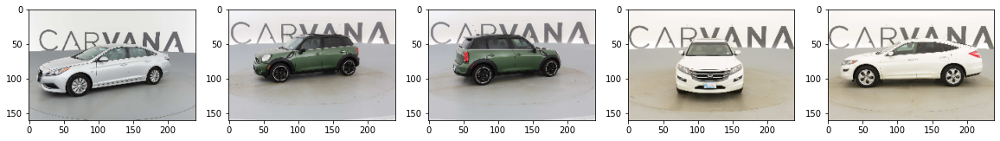

In [7]:
fig, axes = plt.subplots(1, 5, figsize=(20, 5)) 
axes[0].imshow(target[:,:,:,0])
axes[1].imshow(target[:,:,:,1])
axes[2].imshow(target[:,:,:,2])
axes[3].imshow(target[:,:,:,3])
axes[4].imshow(target[:,:,:,4])

#### 2. After DoubleConv Down 0
- #### 11 images
- #### every image has 64 channels (filters)

In [8]:
data = np.load(r'D:\Python\unet_carvana\filter_images\filter_after_down_0.npy')
data.shape

(11, 64, 160, 240)

In [9]:
target = data.transpose(2,3,1,0)
target.shape

(160, 240, 64, 11)

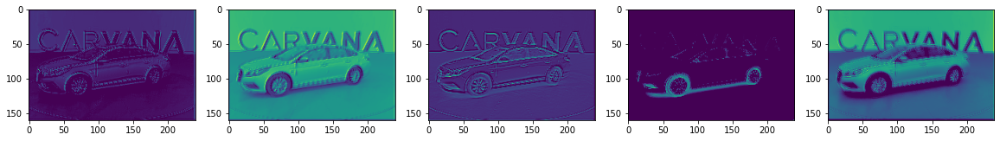

In [10]:
fig, axes = plt.subplots(1, 5, figsize=(20, 5)) 
axes[0].imshow(target[:,:,0,0])
axes[1].imshow(target[:,:,1,0])
axes[2].imshow(target[:,:,2,0])
axes[3].imshow(target[:,:,3,0])
axes[4].imshow(target[:,:,4,0])